In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import plotly.express as px
import seaborn as sns

In [3]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
import statsmodels.api as sm

In [5]:
import scipy.stats as stats

In [6]:
df=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name="ISO NE CA")

In [7]:
df["DA_Demand_scaled"]=(df["DA_Demand"]-df["DA_Demand"].min())/(df["DA_Demand"].max()-df["DA_Demand"].min())

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2880 entries, 0 to 2879
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                2880 non-null   datetime64[ns]
 1   Hr_End              2880 non-null   int64         
 2   DA_Demand           2880 non-null   float64       
 3   RT_Demand           2880 non-null   float64       
 4   DA_LMP              2880 non-null   float64       
 5   DA_EC               2880 non-null   float64       
 6   DA_CC               2880 non-null   float64       
 7   DA_MLC              2880 non-null   float64       
 8   RT_LMP              2880 non-null   float64       
 9   RT_EC               2880 non-null   float64       
 10  RT_CC               2880 non-null   float64       
 11  RT_MLC              2880 non-null   float64       
 12  Dry_Bulb            2880 non-null   int64         
 13  Dew_Point           2880 non-null   int64       

In [9]:
len(df["Date"].value_counts())

120

In [10]:
len(df["Date"].value_counts()==24)

120

In [11]:
df['datetime'] = df['Date'] + pd.to_timedelta(df['Hr_End'], unit='h')

In [12]:
df

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Dew_Point,System_Load,Reg_Service_Price,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,49,10496,0.050000,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,49,10042,0.005000,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,49,9705,0.000000,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,49,9518,0.000000,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,48,9496,0.000000,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,48,13217,0.240000,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,49,12830,0.250000,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,50,12050,0.250000,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,50,11127,0.083333,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00


In [13]:
fig = px.line(df, x='datetime', y="DA_Demand")
fig.show()

In [14]:
fig = px.line(df, x='datetime', y="RT_Demand")
fig.show()

In [15]:
df["DA_RT"]=df["DA_Demand"]-df["RT_Demand"]

In [16]:
fig = px.line(df, x='datetime', y="DA_RT")
fig.show()

In [17]:
df["DA_RT"].mean()

-252.66416909722219

In [18]:
df["DA_RT"].std()

679.9641983508006

In [19]:
fig = px.scatter(df, x='DA_LMP', y="RT_LMP")
fig.add_shape(type='line',
              x0=1,
              y0=1,
              x1=350,
              y1=400,
              line=dict(color='red', width=2, dash='dash')
              )
fig.show()

In [20]:
(df["DA_LMP"]-df["RT_LMP"]).mean()

2.0951354166666665

In [21]:
(df["DA_LMP"]-df["RT_LMP"]).std()

23.832726492851815

In [22]:
df["cost"]=df["DA_Demand"]*df["DA_LMP"]-df["RT_Demand"]*df["RT_LMP"]

In [23]:
fig = px.line(df, x='datetime', y="cost")
fig.show()

In [24]:
df["cost"].mean()

14398.654654888896

In [25]:
df["cost"].median()

31356.888359999954

In [26]:
df["cost"].std()

374773.0036664451

In [27]:
std_cost=(df["cost"]-df["cost"].mean())/df["cost"].std()

In [28]:
std_cost

0      -0.254633
1      -0.229021
2      -0.202445
3      -0.149956
4      -0.084523
          ...   
2875    0.036121
2876    0.189261
2877    0.200634
2878    0.013041
2879   -0.036093
Name: cost, Length: 2880, dtype: float64

(array([2.000e+00, 5.000e+00, 4.000e+00, 7.000e+00, 3.000e+01, 1.280e+02,
        2.481e+03, 1.910e+02, 2.100e+01, 1.100e+01]),
 array([-11.451563  ,  -9.70818333,  -7.96480367,  -6.22142401,
         -4.47804435,  -2.73466468,  -0.99128502,   0.75209464,
          2.4954743 ,   4.23885397,   5.98223363]),
 <BarContainer object of 10 artists>)

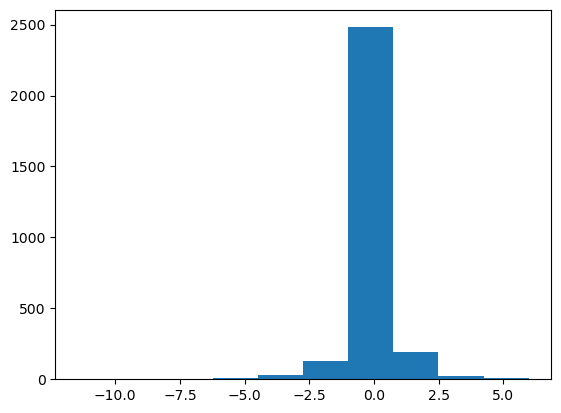

In [29]:
plt.hist(std_cost)

In [30]:
df["RTcost"]=(-df["DA_Demand"]+df["RT_Demand"])*abs(df["RT_LMP"])

In [31]:
fig = px.line(df, x='datetime', y="RTcost")
fig.show()

In [32]:
fig = px.line(df, x='datetime', y="RT_LMP")
fig.show()

## The total consumption is lowest for VT, so lets check the correlation between demand and LMPs

In [33]:
df_VT=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name="VT")
df_VT['datetime'] = df_VT['Date'] + pd.to_timedelta(df_VT['Hr_End'], unit='h')

In [34]:
df_VT.head()

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.0,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.0,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.0,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.0,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.0,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00


In [35]:
df_VT_scaled=df_VT.copy()

In [36]:
df_VT_scaled.iloc[:,[2,3,4,5,6,7,8,9,10]].std(axis=0)

DA_Demand    142.107333
RT_Demand    130.712183
DA_LMP        35.485662
DA_EC         35.833203
DA_CC          2.313702
DA_MLC         0.894920
RT_LMP        41.280504
RT_EC         41.326475
RT_CC          0.267038
dtype: float64

In [37]:
df_VT_scaled.iloc[:,range(2,12)]=(df_VT_scaled.iloc[:,range(2,12)]-
                                  df_VT_scaled.iloc[:,range(2,12)].min(axis=0))/(df_VT_scaled.iloc[:,range(2,12)].max(axis=0)-df_VT_scaled.iloc[:,range(2,12)].min(axis=0))

In [38]:
df_VT_scaled.iloc[:,range(2,12)]

,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC
0,0.572948,0.465955,0.047075,0.050436,0.644173,0.338040,0.221872,0.226268,0.740904,0.408245
1,0.543296,0.435665,0.038369,0.041306,0.644173,0.345515,0.215758,0.219788,0.740904,0.416290
2,0.547164,0.412183,0.033525,0.036131,0.644173,0.352159,0.212827,0.217408,0.740904,0.400201
3,0.549850,0.398040,0.037831,0.040503,0.644173,0.352159,0.211506,0.216786,0.722161,0.389140
4,0.548023,0.397741,0.042579,0.045357,0.644173,0.351329,0.211940,0.216877,0.740904,0.390146
...,...,...,...,...,...,...,...,...,...,...
2875,0.597550,0.586475,0.053691,0.057797,0.641064,0.343854,0.208865,0.213967,0.713341,0.397185
2876,0.591749,0.561525,0.044511,0.047189,0.643828,0.357143,0.196110,0.200092,0.739802,0.411765
2877,0.583154,0.521404,0.029853,0.031952,0.645094,0.357143,0.187028,0.190317,0.755237,0.420814
2878,0.532015,0.470538,0.026909,0.026841,0.644864,0.413621,0.194337,0.197309,0.766262,0.426848


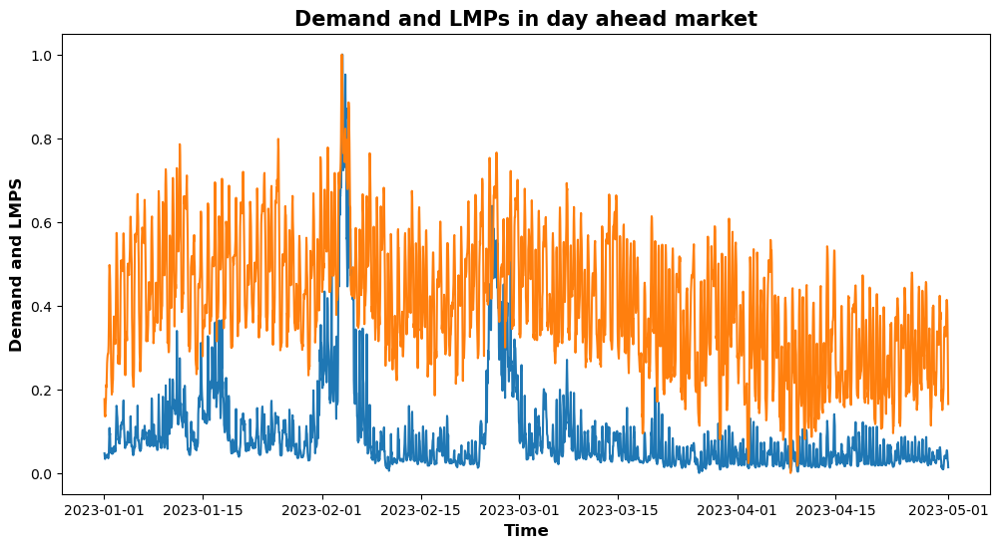

In [39]:
fig = plt.figure(figsize = (12, 6))
#sns.lineplot(data = df_VT_scaled, x = 'datetime', y ='DA_Demand', color="black")
sns.lineplot(data = df_VT_scaled, x = 'datetime', y ='DA_LMP')   
sns.lineplot(data=df, x='datetime', y='DA_Demand_scaled')
plt.title('Demand and LMPs in day ahead market', weight='bold', fontsize = 15)
plt.ylabel('Demand and LMPS', weight='bold', fontsize = 12)
plt.xlabel('Time', weight='bold', fontsize = 12)
plt.show()

In [40]:
r, p = stats.pearsonr(df.dropna()['DA_Demand_scaled'], df_VT.dropna()['DA_LMP'])
print(f"Scipy computed Pearson r: {r} and p-value: {p}")

Scipy computed Pearson r: 0.6156485535948857 and p-value: 4.152416016294907e-300


In [41]:
r, p = stats.pearsonr(df_VT.dropna()['DA_Demand'], df_VT.dropna()['DA_LMP'])
print(f"Scipy computed Pearson r: {r} and p-value: {p}")

Scipy computed Pearson r: 0.31680248434271274 and p-value: 3.7369617871827755e-68


## Time Lagged Cross Correlation — assessing signal dynamics

Time lagged cross correlation (TLCC) can identify directionality between two signals such as a leader-follower relationship in which the leader initiates a response which is repeated by the follower. There are couple ways to do investigate such relationship including Granger causality, used in Economics, but note that these still do not necessarily reflect true causality. Nonetheless we can still extract a sense of which signal occurs first by looking at cross correlations.

In [42]:
df_VT

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.00,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.00,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.00,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.00,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.00,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,501.6,593.521,32.51,33.57,-0.27,-0.79,29.13,30.21,-0.25,-0.83,55,44,2023-04-30 20:00:00
2876,2023-04-30,21,496.2,574.398,29.61,30.27,-0.03,-0.63,22.08,22.63,-0.01,-0.54,55,43,2023-04-30 21:00:00
2877,2023-04-30,22,488.2,543.648,24.98,25.53,0.08,-0.63,17.06,17.29,0.13,-0.36,54,43,2023-04-30 22:00:00
2878,2023-04-30,23,440.6,504.663,24.05,23.94,0.06,0.05,21.10,21.11,0.23,-0.24,54,43,2023-04-30 23:00:00


In [43]:
df_VT["DA_EC"]+df["DA_CC"]+df['DA_MLC']

0       31.27
1       28.42
2       26.81
3       28.17
4       29.67
        ...  
2875    33.84
2876    30.59
2877    25.74
2878    24.12
2879    19.84
Length: 2880, dtype: float64

<Axes: >

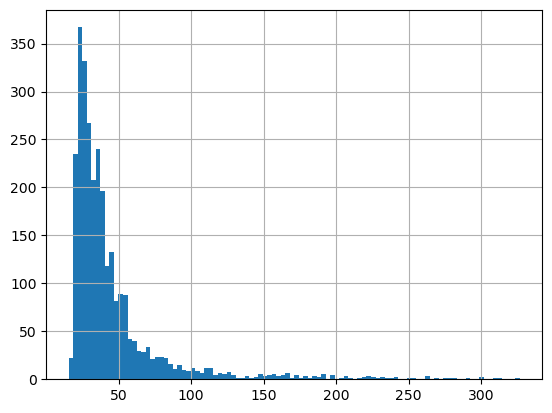

In [44]:
df_VT["DA_EC"].hist(bins=100)

<Axes: >

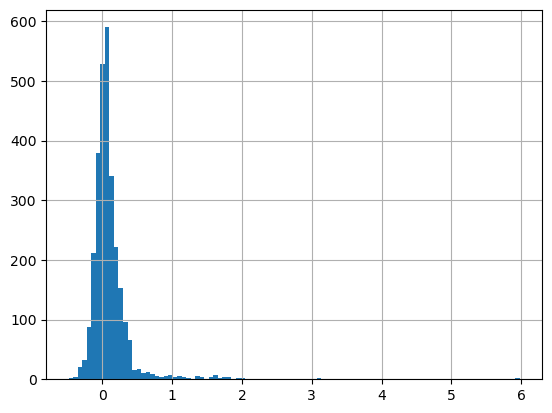

In [45]:
df["DA_MLC"].hist(bins=100)

<Axes: >

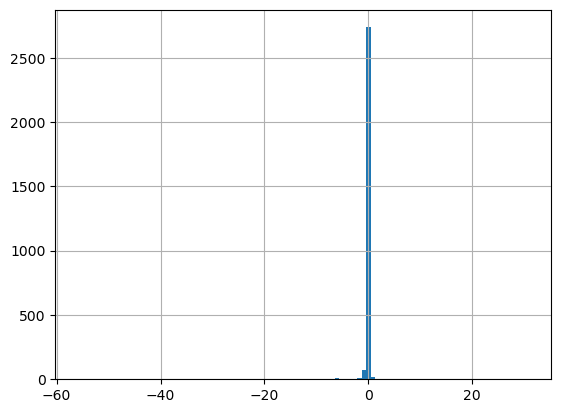

In [46]:
df_VT["DA_CC"].hist(bins=100)

### Proportion of CC and MLC for VT

In [47]:
(df_VT["DA_EC"]/df_VT["DA_LMP"]).mean()

1.0087473240846827

In [48]:
(df_VT["DA_MLC"]/df_VT["DA_LMP"]).mean()

-0.006952982753665792

In [49]:
(df_VT["DA_CC"]/df_VT["DA_LMP"]).mean()

-0.0017943413310171044

### Proportion of CC and MLC for all zones

In [50]:
(df["DA_EC"]/df["DA_LMP"]).mean()

0.9983668820996442

In [51]:
(df["DA_MLC"]/df["DA_LMP"]).mean()

0.0014709884884523483

In [52]:
(df["DA_CC"]/df["DA_LMP"]).mean()

0.00016212941190343205

In [53]:
df

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime,DA_RT,cost,RTcost
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00,-711.383,-81031.00517,26314.05717
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00,-772.616,-71432.40420,25844.00520
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00,-387.592,-61472.24648,12476.58648
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00,-254.312,-41800.93368,8110.00968
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00,124.849,-17278.36343,-3986.42857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00,-420.831,27935.96733,12864.80367
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00,-346.631,85328.55348,7944.78252
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00,-260.851,89590.68495,4577.93505
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00,-408.563,19286.07328,8759.59072


In [54]:
 df_VT

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.00,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.00,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.00,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.00,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.00,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,501.6,593.521,32.51,33.57,-0.27,-0.79,29.13,30.21,-0.25,-0.83,55,44,2023-04-30 20:00:00
2876,2023-04-30,21,496.2,574.398,29.61,30.27,-0.03,-0.63,22.08,22.63,-0.01,-0.54,55,43,2023-04-30 21:00:00
2877,2023-04-30,22,488.2,543.648,24.98,25.53,0.08,-0.63,17.06,17.29,0.13,-0.36,54,43,2023-04-30 22:00:00
2878,2023-04-30,23,440.6,504.663,24.05,23.94,0.06,0.05,21.10,21.11,0.23,-0.24,54,43,2023-04-30 23:00:00


In [55]:
df.rename(columns={'old_column_name': 'new_column_name'}, inplace=True)

In [56]:
zones=["ME","NH","VT","CT","RI","SEMA","WCMA","NEMA"]

In [57]:
zones

['ME', 'NH', 'VT', 'CT', 'RI', 'SEMA', 'WCMA', 'NEMA']

In [58]:
df.rename(columns={'old_column_name': 'new_column_name'}, inplace=True)

In [59]:
dict_df_zones={}
for i in range(8):
    dict_df_zones[i]=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name=zones[i])
    dict_df_zones[i].rename(columns={'DA_Demand': "DA_D_"+zones[i],
                                     'RT_Demand': "RT_D_"+zones[i],
                                     'DA_LMP': "DA_LMP_"+zones[i],
                                     'DA_EC': "DA_EC_"+zones[i],
                                     'DA_CC': "DA_CC_"+zones[i],
                                     'DA_MLC': "DA_MLC_"+zones[i],
                                     'RT_LMP': "RT_LMP_"+zones[i],
                                     'RT_EC': "RT_EC_"+zones[i],
                                     'RT_CC': "RT_CC_"+zones[i],
                                     'RT_MLC': "RT_MLC_"+zones[i],
                                     'Dry_Bulb':"Dry_Bulb_"+zones[i],
                                     'Dew_Point':"Dew_Point_"+zones[i],
                                    }, inplace=True)

In [60]:
len(dict_df_zones)

8

In [61]:
selected_columns = [dict_df_zones[i].iloc[:, 2:] for i in range(0, len(dict_df_zones))]

In [62]:
combined_df= pd.concat(selected_columns, axis=1)

In [63]:
combined_df

,DA_D_ME,RT_D_ME,DA_LMP_ME,DA_EC_ME,DA_CC_ME,DA_MLC_ME,RT_LMP_ME,RT_EC_ME,RT_CC_ME,RT_MLC_ME,...,DA_LMP_NEMA,DA_EC_NEMA,DA_CC_NEMA,DA_MLC_NEMA,RT_LMP_NEMA,RT_EC_NEMA,RT_CC_NEMA,RT_MLC_NEMA,Dry_Bulb_NEMA,Dew_Point_NEMA
0,923.3,1038.795,31.45,31.28,0.00,0.17,37.04,36.93,0.00,0.11,...,31.61,31.28,0.00,0.33,37.36,36.93,0.00,0.43,54,54
1,893.3,986.243,28.54,28.44,0.00,0.10,33.49,33.39,0.00,0.10,...,28.70,28.44,0.00,0.26,33.77,33.39,0.00,0.38,54,53
2,875.3,963.011,26.91,26.83,0.00,0.08,32.05,32.09,0.00,-0.04,...,27.06,26.83,0.00,0.23,32.42,32.09,0.00,0.33,54,53
3,877.6,954.115,28.26,28.19,0.00,0.07,31.70,31.75,0.01,-0.06,...,28.42,28.19,0.00,0.23,32.10,31.75,0.01,0.34,54,52
4,903.5,957.370,29.83,29.70,0.00,0.13,31.77,31.80,0.00,-0.03,...,29.95,29.70,0.00,0.25,32.15,31.80,0.00,0.35,55,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,1034.9,1359.192,32.48,33.57,-0.35,-0.74,27.99,30.21,-1.48,-0.74,...,34.17,33.57,0.06,0.54,30.87,30.21,0.20,0.46,51,51
2876,978.6,1296.247,28.82,30.27,-0.71,-0.74,20.65,22.63,-1.34,-0.64,...,30.84,30.27,0.12,0.45,23.11,22.63,0.16,0.32,52,51
2877,876.5,1202.111,24.71,25.53,-0.36,-0.46,15.60,17.29,-1.19,-0.50,...,25.98,25.53,0.08,0.37,17.68,17.29,0.16,0.23,53,52
2878,807.6,1098.059,23.14,23.94,-0.33,-0.47,19.35,21.11,-1.26,-0.50,...,24.33,23.94,0.06,0.33,21.61,21.11,0.22,0.28,54,53


In [64]:
dem_LMP_zones=combined_df[[col for col in combined_df.columns if col.startswith('DA_D') or col.startswith('RT_D_ME')]]

In [65]:
correlation_matrix = dem_LMP_zones.corr

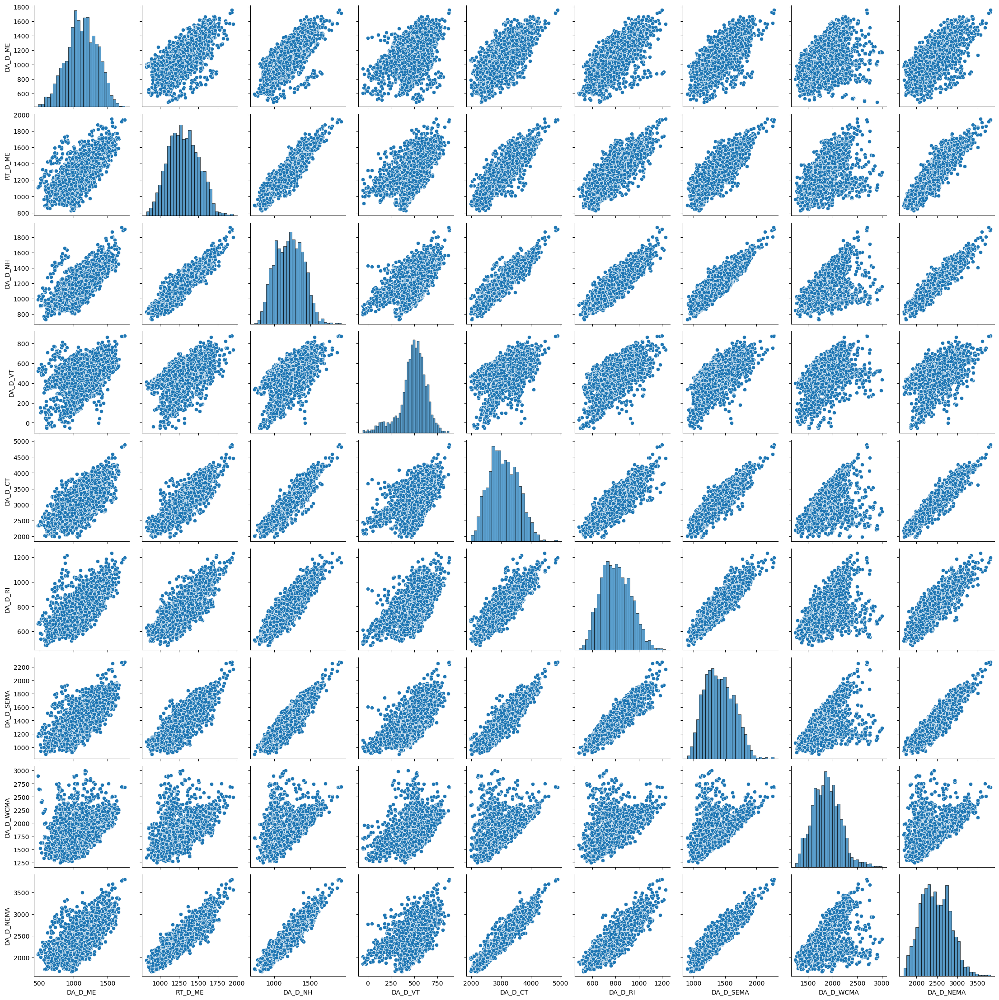

In [66]:
# Basic correlogram
sns.pairplot(dem_LMP_zones)
plt.show()


### Check if each DA_LMPs are stationary

In [67]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

In [68]:
result_adf = adfuller(combined_df["DA_LMP_ME"].values)

In [69]:
result_adf

(-5.210684211096775,
 8.361074392222307e-06,
 25,
 2854,
 {'1%': -3.432643339636199,
  '5%': -2.8625532405212315,
  '10%': -2.5673093777970064},
 20445.170914240673)

In [70]:
result_kpss = kpss(combined_df["DA_LMP_ME"].values, 
              regression = "ct")

In [71]:
result_kpss

(0.1619468307942861,
 0.036710974338094914,
 30,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

## Calculate cross-correlation

In [72]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation. 
    Shifted data filled with NaNs 
    
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else: 
        return datax.corr(datay.shift(lag))

## Regression for LMPs based on Zonal demands

In [73]:
x=combined_df[[col for col in combined_df.columns if col.startswith('DA_D')]]
y = combined_df['DA_LMP_ME']

x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x) 

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:              DA_LMP_ME   R-squared:                       0.389
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     228.6
Date:                Sat, 07 Oct 2023   Prob (F-statistic):          1.55e-300
Time:                        13:47:15   Log-Likelihood:                -13673.
No. Observations:                2880   AIC:                         2.736e+04
Df Residuals:                    2871   BIC:                         2.742e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -118.8546      4.264    -27.877      0.0

In [74]:
plot_demand=combined_df[[col for col in combined_df.columns if col.startswith('DA_D')]]
plot_demand.index=df["datetime"]

In [75]:
plot_demand_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_D')]]
plot_demand_RT.index=df["datetime"]

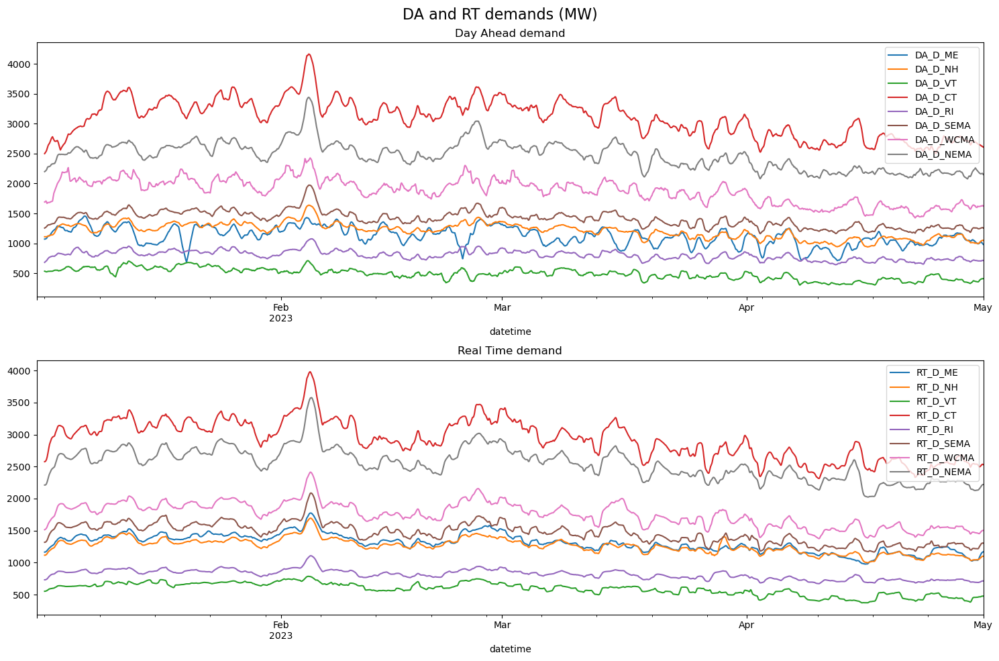

In [76]:
# Create a figure with two vertically stacked subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 10))

# Plot data from df1 on the first subplot (top)

plot_demand.rolling(24).mean().plot(ax=ax1, figsize=(15,10),title="Day Ahead demand")

ax1.legend(loc='upper right')  # Legend for the first subplot

# Plot data from df2 on the second subplot (bottom)
plot_demand_RT.rolling(24).mean().plot(ax=ax2, figsize=(15,10),title="Real Time demand")
ax2.legend(loc='upper right')  # Legend for the second subplot

# Add an overall title to the set of subplots
fig.suptitle("DA and RT demands (MW)", fontsize=16)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [77]:
plot_LMPs_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_LMP')]]
plot_LMPs_DA.index=df["datetime"]

In [78]:
plot_EC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_EC')]]
plot_EC_DA.index=df["datetime"]

In [79]:
plot_CC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_CC')]]
plot_CC_DA.index=df["datetime"]

In [80]:
plot_MLC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_MLC')]]
plot_MLC_DA.index=df["datetime"]

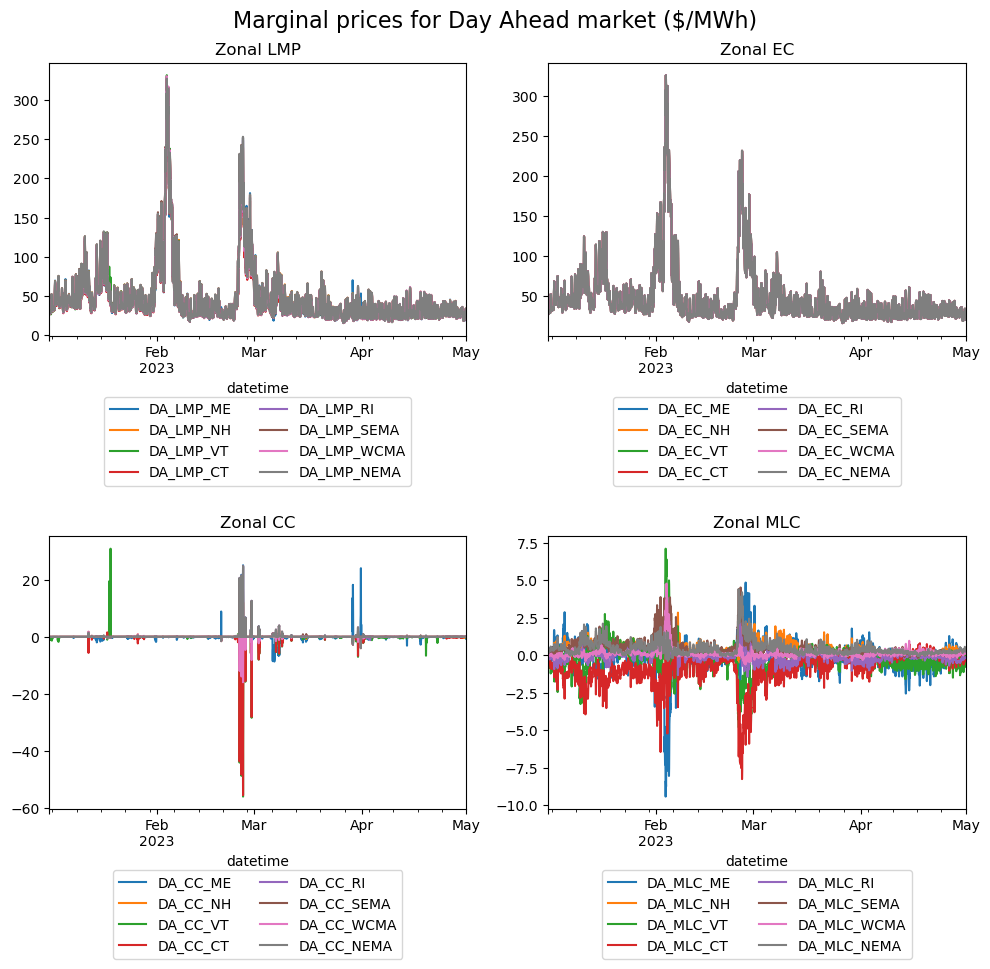

In [81]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
ma=1
# Plot data from df1 on the first subplot (top-left)
plot_LMPs_DA.rolling(ma).mean().plot(ax=axes[0, 0], title="Zonal LMP")
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df2 on the second subplot (top-right)
plot_EC_DA.rolling(ma).mean().plot(ax=axes[0, 1], title="Zonal EC")
axes[0, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2) 
# Plot data from df3 on the third subplot (bottom-left)
plot_CC_DA.rolling(ma).mean().plot(ax=axes[1, 0], title="Zonal CC")
axes[1, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2) 
# Plot data from df4 on the fourth subplot (bottom-right)
plot_MLC_DA.rolling(ma).mean().plot(ax=axes[1, 1], title="Zonal MLC")
axes[1, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
plt.suptitle("Marginal prices for Day Ahead market ($/MWh)", fontsize=16)
# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [82]:
px.line(plot_LMPs_DA)

In [83]:
plot_LMPs_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_LMP')]]
plot_LMPs_RT.index=df["datetime"]
plot_EC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_EC')]]
plot_EC_RT.index=df["datetime"]
plot_CC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_CC')]]
plot_CC_RT.index=df["datetime"]
plot_MLC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_MLC')]]
plot_MLC_RT.index=df["datetime"]

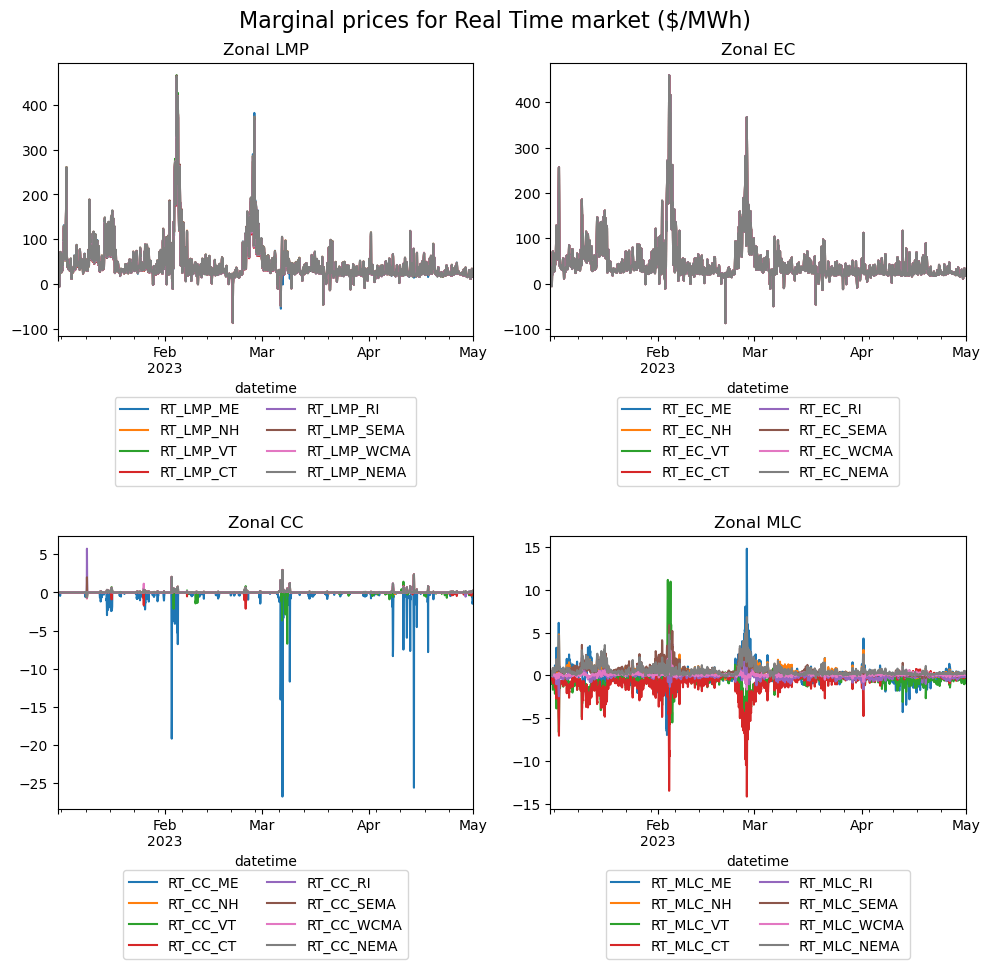

In [84]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
ma=1
# Plot data from df1 on the first subplot (top-left)
plot_LMPs_RT.rolling(ma).mean().plot(ax=axes[0, 0], title="Zonal LMP")
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df2 on the second subplot (top-right)
plot_EC_RT.rolling(ma).mean().plot(ax=axes[0, 1], title="Zonal EC")
axes[0, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2) 
# Plot data from df3 on the third subplot (bottom-left)
plot_CC_RT.rolling(ma).mean().plot(ax=axes[1, 0], title="Zonal CC")
axes[1, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2) 
# Plot data from df4 on the fourth subplot (bottom-right)
plot_MLC_RT.rolling(ma).mean().plot(ax=axes[1, 1], title="Zonal MLC")
axes[1, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
plt.suptitle("Marginal prices for Real Time market ($/MWh)", fontsize=16)
# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [85]:
combined_df['datetime']=df['datetime']

### ==================================================================================

In [86]:
scaler = StandardScaler()
dalmp=combined_df[[col for col in combined_df.columns if col.startswith('DA_LMP')]]
dalmp_standardized = scaler.fit_transform(dalmp)
pca = PCA(n_components=2)
pca.fit(dalmp_standardized)
print(pca.explained_variance_ratio_*100)

[99.80530999  0.16478396]


In [87]:
reduced_data=pd.DataFrame(pca.fit_transform(dalmp_standardized, y=None))
reduced_data["datetime"]=df["datetime"]
reduced_data["hr"]=np.array(df["Hr_End"])

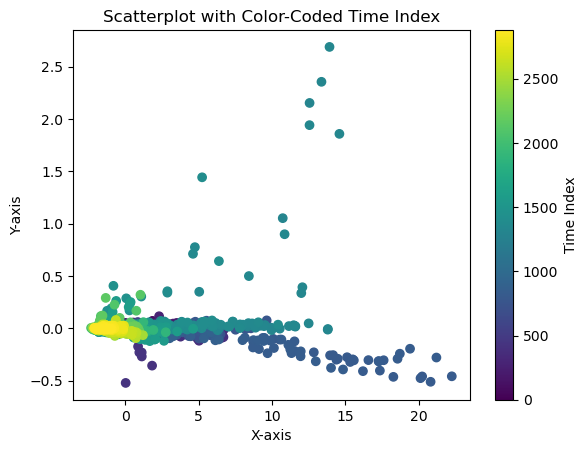

In [88]:
# Create a colormap for coloring the points based on time index
colormap = plt.cm.viridis  # You can choose a different colormap
plt.scatter(reduced_data[0],reduced_data[1], c=range(len(df)), cmap=colormap)
plt.colorbar(label='Time Index')

# Set axis labels and plot title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatterplot with Color-Coded Time Index')

# Show the plot
plt.show()

In [89]:
fig = px.scatter(reduced_data, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 marginal_x="histogram", marginal_y="rug",
                 width=800, height=600)
fig.show()

## Check the temperatures

In [90]:
drybulb=combined_df[[col for col in combined_df.columns if col.startswith('Dry_Bulb')]]

In [91]:
drybulb.index=df["datetime"]

In [92]:
ptdrybulb=pd.DataFrame(columns=drybulb.columns.to_list())
for i in range(8):
    ptdrybulb.iloc[:, i]=drybulb.iloc[:, i] + i * 50


C:\Users\dube.rohit\AppData\Local\Temp\ipykernel_17516\1202089833.py:3: DeprecationWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [93]:
px.line(ptdrybulb)

In [94]:
scaler = StandardScaler()
drybulb_standardized = scaler.fit_transform(drybulb)
pca = PCA(n_components=3)
pca.fit(drybulb_standardized)
print(pca.explained_variance_ratio_*100)

[92.12280839  3.05742987  1.84395114]


In [95]:
reduced_db=pd.DataFrame(pca.fit_transform(drybulb_standardized, y=None))
reduced_db["datetime"]=df["datetime"]
reduced_db["hr"]=np.array(df["Hr_End"])

In [96]:
fig = px.scatter(reduced_db, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()

## Since the total LMP are highly correlated, check correlation in the day ahead congestion and the loss components

In [97]:
## Congestion cost
da_cc=combined_df[[col for col in combined_df.columns if col.startswith('DA_CC')]]
da_cc
scaler = StandardScaler()
da_cc_standardized = scaler.fit_transform(da_cc)
pca = PCA(n_components=3)
pca.fit(da_cc_standardized)
print(pca.explained_variance_ratio_*100)
da_reduced_cc=pd.DataFrame(pca.fit_transform(da_cc_standardized, y=None))
da_reduced_cc["datetime"]=df["datetime"]
da_reduced_cc["hr"]=np.array(df["Hr_End"])

[89.2786314   8.80707812  1.5033348 ]


In [98]:
fig = px.scatter(da_reduced_cc, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()

In [99]:
## cost of loss
da_mlc=combined_df[[col for col in combined_df.columns if col.startswith('DA_MLC')]]
da_mlc
scaler = StandardScaler()
da_mlc_standardized = scaler.fit_transform(da_mlc)
pca = PCA(n_components=5)
pca.fit(da_mlc_standardized)
print(pca.explained_variance_ratio_*100)
da_reduced_mlc=pd.DataFrame(pca.fit_transform(da_mlc_standardized, y=None))
da_reduced_mlc["datetime"]=df["datetime"]
da_reduced_mlc["hr"]=np.array(df["Hr_End"])


[39.47924033 37.52276668 13.79248622  4.45557822  2.00000178]


In [100]:
fig = px.scatter(da_reduced_mlc, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()

## Check correlation of da demand

In [101]:
## cost of loss
scaler = StandardScaler()
da_demand_standardized = scaler.fit_transform(plot_demand)
pca = PCA(n_components=8)
pca.fit(da_demand_standardized )
print(pca.explained_variance_ratio_*100)
da_reduced_demand=pd.DataFrame(pca.fit_transform(da_demand_standardized , y=None))
da_reduced_demand["datetime"]=df["datetime"]
da_reduced_demand["hr"]=np.array(df["Hr_End"])

[74.21369064  9.83331954  6.76731706  5.34022007  1.60217033  1.01240495
  0.73004506  0.50083234]


In [102]:
combined_df

,DA_D_ME,RT_D_ME,DA_LMP_ME,DA_EC_ME,DA_CC_ME,DA_MLC_ME,RT_LMP_ME,RT_EC_ME,RT_CC_ME,RT_MLC_ME,...,DA_EC_NEMA,DA_CC_NEMA,DA_MLC_NEMA,RT_LMP_NEMA,RT_EC_NEMA,RT_CC_NEMA,RT_MLC_NEMA,Dry_Bulb_NEMA,Dew_Point_NEMA,datetime
0,923.3,1038.795,31.45,31.28,0.00,0.17,37.04,36.93,0.00,0.11,...,31.28,0.00,0.33,37.36,36.93,0.00,0.43,54,54,2023-01-01 01:00:00
1,893.3,986.243,28.54,28.44,0.00,0.10,33.49,33.39,0.00,0.10,...,28.44,0.00,0.26,33.77,33.39,0.00,0.38,54,53,2023-01-01 02:00:00
2,875.3,963.011,26.91,26.83,0.00,0.08,32.05,32.09,0.00,-0.04,...,26.83,0.00,0.23,32.42,32.09,0.00,0.33,54,53,2023-01-01 03:00:00
3,877.6,954.115,28.26,28.19,0.00,0.07,31.70,31.75,0.01,-0.06,...,28.19,0.00,0.23,32.10,31.75,0.01,0.34,54,52,2023-01-01 04:00:00
4,903.5,957.370,29.83,29.70,0.00,0.13,31.77,31.80,0.00,-0.03,...,29.70,0.00,0.25,32.15,31.80,0.00,0.35,55,52,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,1034.9,1359.192,32.48,33.57,-0.35,-0.74,27.99,30.21,-1.48,-0.74,...,33.57,0.06,0.54,30.87,30.21,0.20,0.46,51,51,2023-04-30 20:00:00
2876,978.6,1296.247,28.82,30.27,-0.71,-0.74,20.65,22.63,-1.34,-0.64,...,30.27,0.12,0.45,23.11,22.63,0.16,0.32,52,51,2023-04-30 21:00:00
2877,876.5,1202.111,24.71,25.53,-0.36,-0.46,15.60,17.29,-1.19,-0.50,...,25.53,0.08,0.37,17.68,17.29,0.16,0.23,53,52,2023-04-30 22:00:00
2878,807.6,1098.059,23.14,23.94,-0.33,-0.47,19.35,21.11,-1.26,-0.50,...,23.94,0.06,0.33,21.61,21.11,0.22,0.28,54,53,2023-04-30 23:00:00


## Check for stationarity

In [103]:
from statsmodels.tsa.stattools import adfuller

In [104]:
plot_demand

,DA_D_ME,DA_D_NH,DA_D_VT,DA_D_CT,DA_D_RI,DA_D_SEMA,DA_D_WCMA,DA_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,923.3,948.0,478.7,2237.6,624.5,1085.5,1398.1,1949.2
2023-01-01 02:00:00,893.3,903.0,451.1,2133.8,586.6,1020.6,1342.8,1866.1
2023-01-01 03:00:00,875.3,895.5,454.7,2080.5,580.5,1002.9,1578.9,1829.7
2023-01-01 04:00:00,877.6,887.3,457.2,2051.7,582.5,997.8,1577.0,1816.6
2023-01-01 05:00:00,903.5,891.0,455.5,2058.2,588.6,999.4,1899.1,1829.9
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1034.9,1167.5,501.6,3001.9,862.5,1469.6,1752.0,2527.5
2023-04-30 21:00:00,978.6,1136.9,496.2,2892.2,827.8,1451.6,1731.6,2455.5
2023-04-30 22:00:00,876.5,1067.6,488.2,2758.8,811.4,1403.2,1638.1,2408.9


In [105]:
# Define a function to check stationarity using ADF test
def check_stationarity(column_data):
    result = adfuller(column_data)
    p_value = result[1]
    if p_value <= 0.05:
        return "Stationary (p-value: {:.4f})".format(p_value)
    else:
        return "Non-Stationary (p-value: {:.4f})".format(p_value)

In [106]:
# Check stationarity for each column in the DataFrame
for column in plot_demand.columns:
    stationarity_result = check_stationarity(plot_demand[column])
    print(f"{column}: {stationarity_result}")

DA_D_ME: Stationary (p-value: 0.0000)
DA_D_NH: Stationary (p-value: 0.0031)
DA_D_VT: Stationary (p-value: 0.0006)
DA_D_CT: Stationary (p-value: 0.0024)
DA_D_RI: Stationary (p-value: 0.0000)
DA_D_SEMA: Stationary (p-value: 0.0008)
DA_D_WCMA: Stationary (p-value: 0.0029)
DA_D_NEMA: Stationary (p-value: 0.0012)


In [107]:
# Check stationarity for each column in the DataFrame
for column in plot_LMPs_DA.columns:
    stationarity_result = check_stationarity(plot_LMPs_DA[column])
    print(f"{column}: {stationarity_result}")

DA_LMP_ME: Stationary (p-value: 0.0000)
DA_LMP_NH: Stationary (p-value: 0.0000)
DA_LMP_VT: Stationary (p-value: 0.0000)
DA_LMP_CT: Stationary (p-value: 0.0000)
DA_LMP_RI: Stationary (p-value: 0.0000)
DA_LMP_SEMA: Stationary (p-value: 0.0000)
DA_LMP_WCMA: Stationary (p-value: 0.0000)
DA_LMP_NEMA: Stationary (p-value: 0.0000)


In [108]:
adfuller(plot_LMPs_DA["DA_LMP_ME"].values)

(-5.210684211096775,
 8.361074392222307e-06,
 25,
 2854,
 {'1%': -3.432643339636199,
  '5%': -2.8625532405212315,
  '10%': -2.5673093777970064},
 20445.170914240673)

In [109]:
# Check stationarity for each column in the DataFrame
for column in drybulb.columns:
    stationarity_result = check_stationarity(drybulb[column])
    print(f"{column}: {stationarity_result}")

Dry_Bulb_ME: Stationary (p-value: 0.0001)
Dry_Bulb_NH: Stationary (p-value: 0.0002)
Dry_Bulb_VT: Stationary (p-value: 0.0000)
Dry_Bulb_CT: Stationary (p-value: 0.0000)
Dry_Bulb_RI: Stationary (p-value: 0.0000)
Dry_Bulb_SEMA: Stationary (p-value: 0.0000)
Dry_Bulb_WCMA: Stationary (p-value: 0.0000)
Dry_Bulb_NEMA: Stationary (p-value: 0.0000)


## Granger tests for dependence of LMPs on the demands in zones

In [110]:
drybulb["Dry_Bulb_ME"]

datetime
2023-01-01 01:00:00    44
2023-01-01 02:00:00    45
2023-01-01 03:00:00    44
2023-01-01 04:00:00    47
2023-01-01 05:00:00    46
                       ..
2023-04-30 20:00:00    46
2023-04-30 21:00:00    47
2023-04-30 22:00:00    48
2023-04-30 23:00:00    48
2023-05-01 00:00:00    49
Name: Dry_Bulb_ME, Length: 2880, dtype: int64

## Find the ARIMA structure

In [111]:
import pmdarima as pm
from pmdarima import model_selection

In [112]:
# Define a function to find the ARIMA structure for a given time series
def find_arima_structure(column_data):
    # Use auto_arima to automatically select the ARIMA orders
    #model = sm.tsa.auto_arima(column_data, seasonal=False, stepwise=True, suppress_warnings=True)
    model = sm.tsa.auto_arima(column_data, seasonal=False, stepwise=True, suppress_warnings=True)
    return {
        'p': model.order[0],
        'd': model.order[1],
        'q': model.order[2]
    }

In [113]:
a=(drybulb["Dry_Bulb_ME"]-np.mean(drybulb["Dry_Bulb_ME"]))/np.std(drybulb["Dry_Bulb_ME"])

In [114]:
px.line(plot_LMPs_RT["RT_LMP_ME"])

In [115]:
%store

Stored variables and their in-db values:
